# KITTI Dataset Exploration for Real-Time Object Detection

This notebook designed to downloading and exploring the KITTI dataset for autonomous vehicle object detection.

## 1. Setup and Environment Configuration

In [2]:
# Install required libraries
!pip install -q opencv-python matplotlib numpy pandas seaborn pillow tqdm

In [3]:
# Import libraries
import os
import io
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import zipfile
import requests
from pathlib import Path
from PIL import Image
from tqdm.auto import tqdm
import random
import warnings
warnings.filterwarnings('ignore')

In [4]:
# Set up matplotlib for better visualization
plt.style.use('fivethirtyeight')
plt.rcParams['figure.figsize'] = (15, 8)
plt.rcParams['axes.grid'] = True

In [5]:
# Create directory structure
BASE_DIR = Path('/content')
DATASETS_DIR = BASE_DIR / 'datasets'
RAW_DIR = DATASETS_DIR / 'raw'
KITTI_DIR = RAW_DIR / 'kitti'

# Create directories
for directory in [DATASETS_DIR, RAW_DIR, KITTI_DIR]:
    directory.mkdir(parents=True, exist_ok=True)

print("Directory structure created successfully.")

Directory structure created successfully.


## 2. Download KITTI Dataset

In [6]:
# KITTI Dataset URLs
KITTI_URLS = {
    'image': 'https://s3.eu-central-1.amazonaws.com/avg-kitti/data_object_image_2.zip',
    'label': 'https://s3.eu-central-1.amazonaws.com/avg-kitti/data_object_label_2.zip',
    'calib': 'https://s3.eu-central-1.amazonaws.com/avg-kitti/data_object_calib.zip'
}

def download_file(url, destination):
    """Download a file with a progress bar"""
    response = requests.get(url, stream=True)
    total_size = int(response.headers.get('content-length', 0))
    block_size = 1024  # 1 Kibibyte

    if destination.exists():
        print(f"File already exists: {destination}")
        return destination

    print(f"Downloading {url} to {destination}")
    progress_bar = tqdm(total=total_size, unit='iB', unit_scale=True)

    with open(destination, 'wb') as file:
        for data in response.iter_content(block_size):
            progress_bar.update(len(data))
            file.write(data)
    progress_bar.close()

    return destination

def extract_zip(zip_path, extract_dir):
    """Extract a zip file with a progress bar"""
    print(f"Extracting {zip_path} to {extract_dir}")

    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        members = zip_ref.namelist()
        progress_bar = tqdm(total=len(members))

        for member in members:
            zip_ref.extract(member, extract_dir)
            progress_bar.update(1)

        progress_bar.close()

# Download and extract KITTI files
for name, url in KITTI_URLS.items():
    zip_path = RAW_DIR / f"kitti_{name}.zip"

    # Download the file
    download_file(url, zip_path)

    # Extract the file
    extract_zip(zip_path, KITTI_DIR)

print("KITTI dataset download and extraction completed.")

  0%|          | 0.00/12.6G [00:00<?, ?iB/s]

Extracting /content/datasets/raw/kitti_image.zip to /content/datasets/raw/kitti


  0%|          | 0/15001 [00:00<?, ?it/s]

  0%|          | 0.00/5.60M [00:00<?, ?iB/s]

Extracting /content/datasets/raw/kitti_label.zip to /content/datasets/raw/kitti


  0%|          | 0/7482 [00:00<?, ?it/s]

  0%|          | 0.00/26.9M [00:00<?, ?iB/s]

Extracting /content/datasets/raw/kitti_calib.zip to /content/datasets/raw/kitti


  0%|          | 0/15001 [00:00<?, ?it/s]

KITTI dataset download and extraction completed.


## 3. Basic Dataset Exploration

In [8]:
# Define paths to KITTI directories
KITTI_IMAGES_DIR = KITTI_DIR / "training" / "image_2"
KITTI_LABELS_DIR = KITTI_DIR / "training" / "label_2"
KITTI_CALIB_DIR = KITTI_DIR / "training" / "calib"

# Check if the directories exist
paths_exist = (KITTI_IMAGES_DIR.exists(), KITTI_LABELS_DIR.exists(), KITTI_CALIB_DIR.exists())
print(f"KITTI directories exist - Images: {paths_exist[0]}, Labels: {paths_exist[1]}, Calibration: {paths_exist[2]}")

# If standard paths don't exist, try alternate paths
if not all(paths_exist):
    alt_paths = [
        (KITTI_DIR / "image_2", KITTI_DIR / "label_2", KITTI_DIR / "calib"),
        (KITTI_DIR / "image", KITTI_DIR / "label", KITTI_DIR / "calib"),
        (KITTI_DIR / "image", KITTI_DIR / "lable", KITTI_DIR / "calib") # Common typo in some datasets
    ]

    for img_dir, lbl_dir, cal_dir in alt_paths:
        if img_dir.exists() and lbl_dir.exists():
            KITTI_IMAGES_DIR = img_dir
            KITTI_LABELS_DIR = lbl_dir
            KITTI_CALIB_DIR = cal_dir
            print(f"Using alternate paths - Images: {img_dir}, Labels: {lbl_dir}, Calibration: {cal_dir}")
            break

# Count files
image_files = list(KITTI_IMAGES_DIR.glob("*.png"))
label_files = list(KITTI_LABELS_DIR.glob("*.txt"))
calib_files = list(KITTI_CALIB_DIR.glob("*.txt"))

print(f"Found {len(image_files)} images, {len(label_files)} labels, and {len(calib_files)} calibration files")

# Display sample image count by extension
extensions = ['.png', '.jpg', '.jpeg', '.bmp']
for ext in extensions:
    count = len(list(KITTI_IMAGES_DIR.glob(f"*{ext}")))
    if count > 0:
        print(f"  {ext}: {count} images")

KITTI directories exist - Images: True, Labels: True, Calibration: True
Found 7481 images, 7481 labels, and 7481 calibration files
  .png: 7481 images


## 4. Understanding Label Format


In [14]:
def read_kitti_label(label_file):
    """Read a KITTI label file and return a DataFrame"""
    columns = [
        'type', 'truncated', 'occluded', 'alpha',
        'bbox_left', 'bbox_top', 'bbox_right', 'bbox_bottom',
        'dim_height', 'dim_width', 'dim_length',
        'loc_x', 'loc_y', 'loc_z', 'rotation_y'
    ]

    data = []
    with open(label_file, 'r') as f:
        for line in f:
            values = line.strip().split()
            if len(values) >= len(columns):
                # Convert string values to appropriate types
                values[1:] = [float(v) for v in values[1:len(columns)]]
                data.append(values[:len(columns)])

    return pd.DataFrame(data, columns=columns)

# Read a sample label file
if label_files:
    sample_label_file = label_files[0]
    sample_df = read_kitti_label(sample_label_file)

    print(f"Sample label file: {sample_label_file.name}")
    print("\nLabel format explanation:")
    print("- 'type': Object type (Car, Van, Truck, Pedestrian, etc.)")
    print("- 'truncated': Float from 0 (non-truncated) to 1 (truncated), where truncation indicates that the object leaves image boundaries")
    print("- 'occluded': Integer (0,1,2,3) indicating occlusion state: 0=fully visible, 1=partly occluded, 2=largely occluded, 3=unknown")
    print("- 'alpha': Observation angle of the object [-π,π]")
    print("- 'bbox_left', 'bbox_top', 'bbox_right', 'bbox_bottom': 2D bounding box coordinates in image (0-based index)")
    print("- 'dim_height', 'dim_width', 'dim_length': 3D object dimensions (height, width, length)")
    print("- 'loc_x', 'loc_y', 'loc_z': 3D object location (x,y,z) in camera coordinates")
    print("- 'rotation_y': Rotation around Y-axis in camera coordinates [-π,π]")

    print("\nSample data:")
    display(sample_df)
else:
    print("No label files found")

Sample label file: 006349.txt

Label format explanation:
- 'type': Object type (Car, Van, Truck, Pedestrian, etc.)
- 'truncated': Float from 0 (non-truncated) to 1 (truncated), where truncation indicates that the object leaves image boundaries
- 'occluded': Integer (0,1,2,3) indicating occlusion state: 0=fully visible, 1=partly occluded, 2=largely occluded, 3=unknown
- 'alpha': Observation angle of the object [-π,π]
- 'bbox_left', 'bbox_top', 'bbox_right', 'bbox_bottom': 2D bounding box coordinates in image (0-based index)
- 'dim_height', 'dim_width', 'dim_length': 3D object dimensions (height, width, length)
- 'loc_x', 'loc_y', 'loc_z': 3D object location (x,y,z) in camera coordinates
- 'rotation_y': Rotation around Y-axis in camera coordinates [-π,π]

Sample data:


,type,truncated,occluded,alpha,bbox_left,bbox_top,bbox_right,bbox_bottom,dim_height,dim_width,dim_length,loc_x,loc_y,loc_z,rotation_y
0,Misc,0.0,0.0,-1.74,763.14,172.39,890.06,287.92,1.63,1.48,2.37,3.27,1.64,11.40,-1.47
1,Car,0.0,0.0,-1.67,659.68,187.82,698.89,218.06,1.41,1.58,4.36,3.49,2.21,37.26,-1.57


## 5. Visualize Images with Bounding Boxes


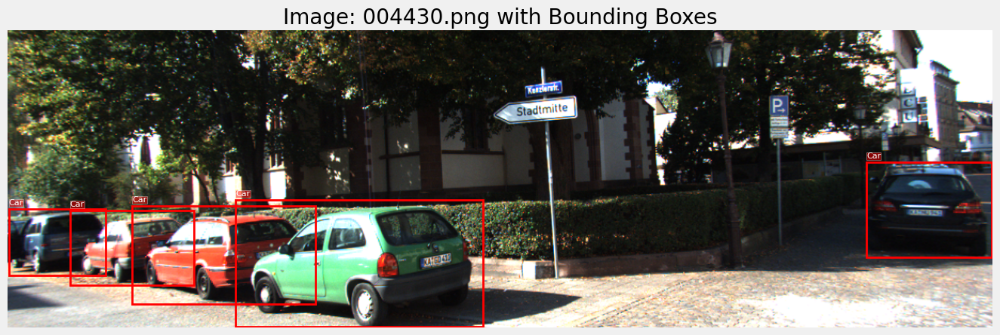

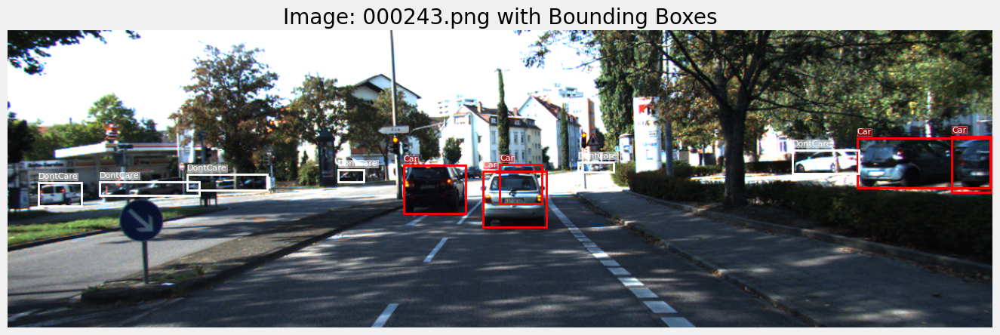

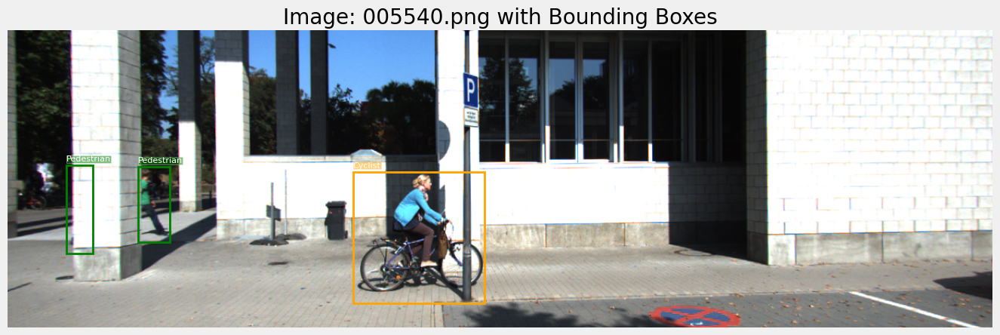

In [15]:
def visualize_image_with_boxes(image_file, label_file, figsize=(15, 10)):
    """Display an image with its bounding boxes"""
    # Read the image
    img = cv2.imread(str(image_file))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Read the labels
    df = read_kitti_label(label_file)

    # Create figure
    plt.figure(figsize=figsize)
    plt.imshow(img)

    # Define colors for different object types
    colors = {
        'Car': 'red',
        'Van': 'blue',
        'Truck': 'purple',
        'Pedestrian': 'green',
        'Person_sitting': 'yellow',
        'Cyclist': 'orange',
        'Tram': 'cyan',
        'Misc': 'white'
    }

    # Draw bounding boxes
    for _, row in df.iterrows():
        obj_type = row['type']
        left = float(row['bbox_left'])
        top = float(row['bbox_top'])
        right = float(row['bbox_right'])
        bottom = float(row['bbox_bottom'])

        # Calculate width and height
        width = right - left
        height = bottom - top

        # Set color based on object type
        color = colors.get(obj_type, 'white')

        # Draw rectangle
        rect = plt.Rectangle((left, top), width, height, fill=False, edgecolor=color, linewidth=2)
        plt.gca().add_patch(rect)

        # Add label
        plt.text(left, top-5, obj_type, bbox={'facecolor': color, 'alpha': 0.5, 'pad': 0}, fontsize=8, color='white')

    plt.title(f'Image: {image_file.name} with Bounding Boxes')
    plt.axis('off')
    plt.show()

# Visualize a few random images with bounding boxes
if image_files and label_files:
    # Select 3 random image files
    sample_indices = random.sample(range(len(image_files)), min(3, len(image_files)))

    for idx in sample_indices:
        image_file = image_files[idx]
        label_file = KITTI_LABELS_DIR / f"{image_file.stem}.txt"

        if label_file.exists():
            visualize_image_with_boxes(image_file, label_file)
        else:
            print(f"No label file found for {image_file.name}")
else:
    print("No image files or label files found")

## 6. Analyze Class Distribution

  0%|          | 0/7481 [00:00<?, ?it/s]

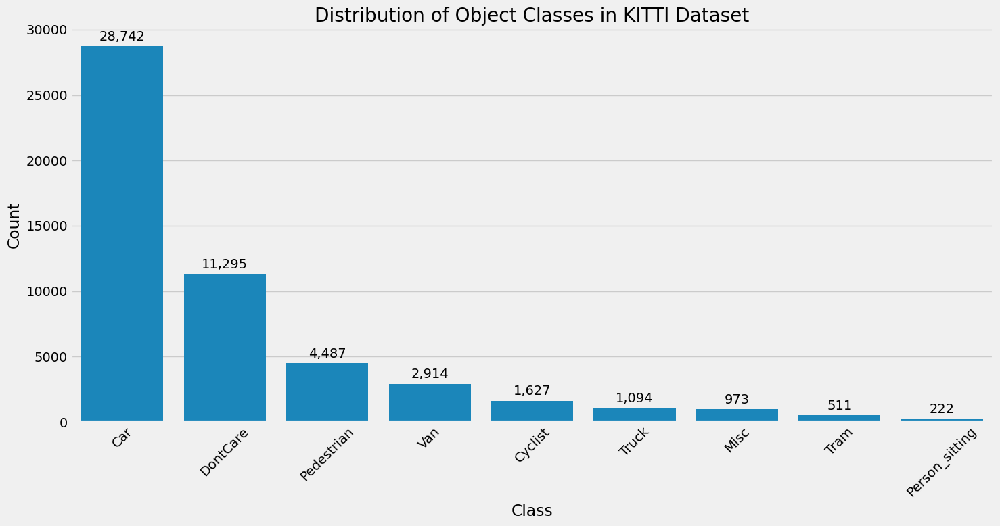


Class distribution summary:


,Class,Count
1,Car,28742
4,DontCare,11295
6,Pedestrian,4487
2,Van,2914
5,Cyclist,1627
3,Truck,1094
0,Misc,973
7,Tram,511
8,Person_sitting,222


In [16]:
def analyze_class_distribution():
    """Analyze and visualize the distribution of classes in the dataset"""
    class_counts = {}

    # Process all label files
    for label_file in tqdm(label_files):
        df = read_kitti_label(label_file)

        for obj_type in df['type']:
            if obj_type in class_counts:
                class_counts[obj_type] += 1
            else:
                class_counts[obj_type] = 1

    # Convert to DataFrame for easier visualization
    class_df = pd.DataFrame({
        'Class': list(class_counts.keys()),
        'Count': list(class_counts.values())
    })
    class_df = class_df.sort_values(by='Count', ascending=False)

    # Create bar plot
    plt.figure(figsize=(15, 8))
    ax = sns.barplot(data=class_df, x='Class', y='Count')

    # Add value labels on top of bars
    for p in ax.patches:
        ax.annotate(format(int(p.get_height()), ','),
                   (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha = 'center', va = 'center',
                   xytext = (0, 10),
                   textcoords = 'offset points')

    plt.title('Distribution of Object Classes in KITTI Dataset')
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.grid(True, axis='y')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    return class_df

# Analyze class distribution
class_distribution = analyze_class_distribution()
print("\nClass distribution summary:")
display(class_distribution)

## 7. Analyze Object Size Distribution

  0%|          | 0/7481 [00:00<?, ?it/s]

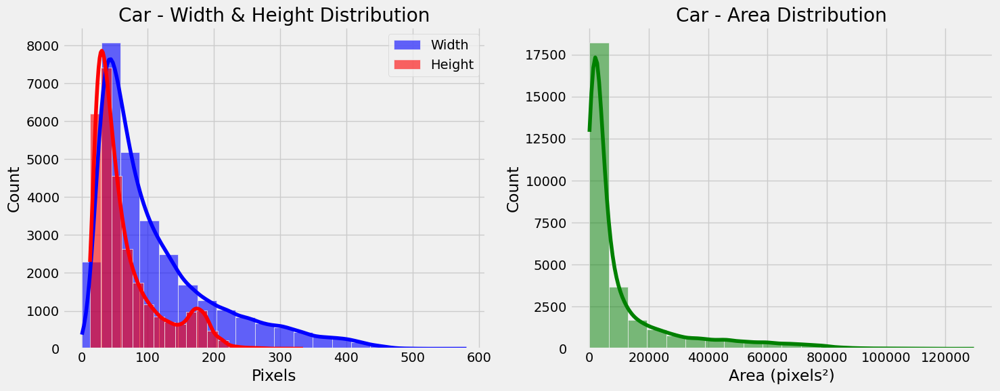

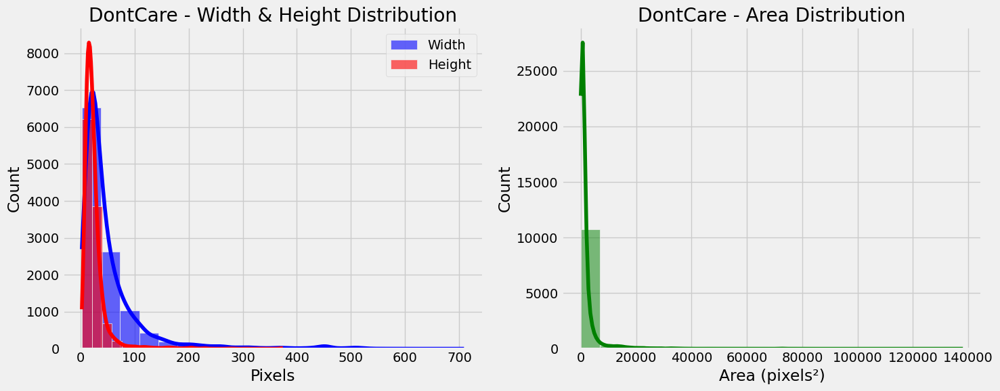

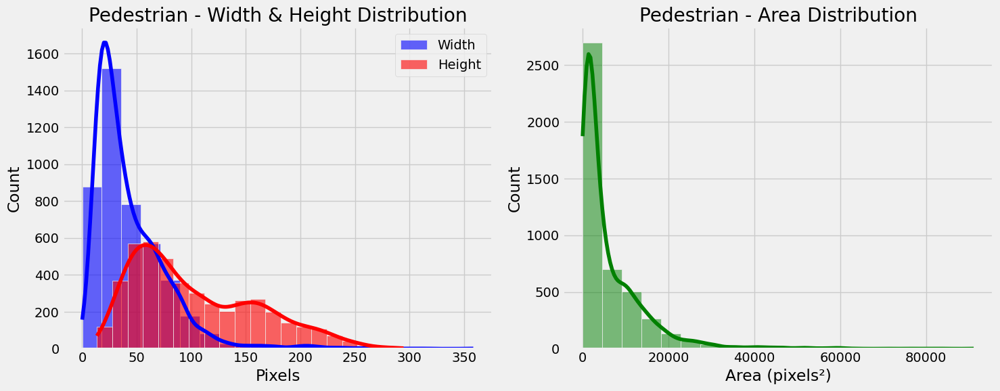

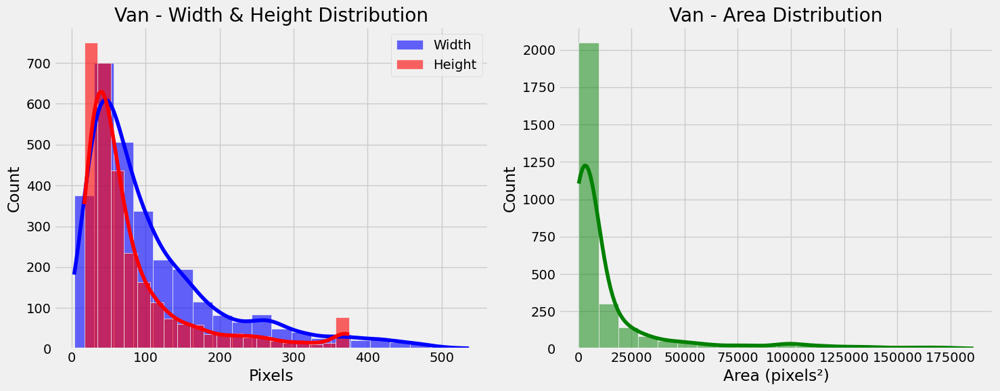

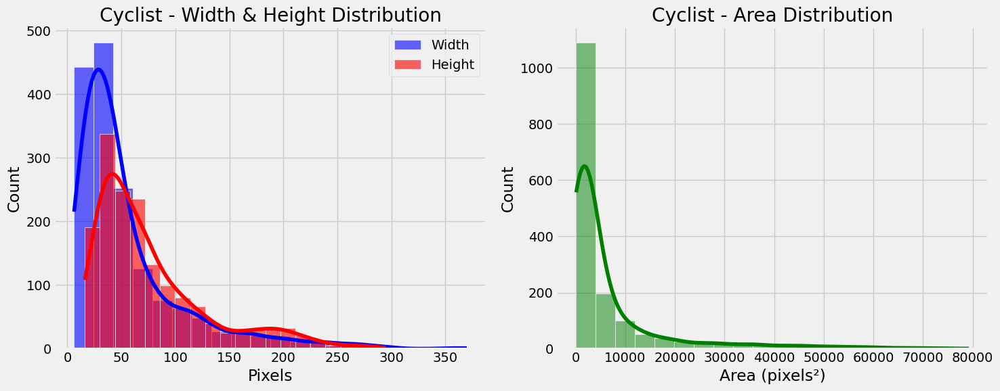


Object size statistics summary:


,Class,Count,Avg Width,Avg Height,Avg Area,Min Area,Max Area
1,Car,28742,111.949545,66.121695,11282.681942,10.6904,129655.0665
4,DontCare,11295,53.372848,25.647135,1882.530222,8.2944,138039.9835
6,Pedestrian,4487,43.816191,103.719405,6220.233472,1.4872,91092.4430
2,Van,2914,109.652725,83.600216,15564.202192,248.6208,185754.5800
5,Cyclist,1627,55.849422,76.885575,6675.826366,101.5335,79218.5940
3,Truck,1094,99.720612,86.405530,15137.241942,684.4200,190706.3400
0,Misc,973,90.717554,74.462559,10898.634184,290.7702,170257.5000
7,Tram,511,153.412505,104.219706,25043.727345,494.4100,189035.5320
8,Person_sitting,222,83.637658,102.283649,9724.048317,519.5560,42288.2218


In [18]:
def analyze_object_sizes():
    """Analyze the distribution of object sizes in the dataset"""
    # Prepare data structure
    class_sizes = {}

    # Process all label files
    for label_file in tqdm(label_files):
        df = read_kitti_label(label_file)

        for _, row in df.iterrows():
            obj_type = row['type']
            width = float(row['bbox_right']) - float(row['bbox_left'])
            height = float(row['bbox_bottom']) - float(row['bbox_top'])
            area = width * height

            if obj_type not in class_sizes:
                class_sizes[obj_type] = {'widths': [], 'heights': [], 'areas': []}

            class_sizes[obj_type]['widths'].append(width)
            class_sizes[obj_type]['heights'].append(height)
            class_sizes[obj_type]['areas'].append(area)

    # Calculate statistics for each class
    stats = []
    for obj_type, data in class_sizes.items():
        stats.append({
            'Class': obj_type,
            'Count': len(data['widths']),
            'Avg Width': np.mean(data['widths']),
            'Avg Height': np.mean(data['heights']),
            'Avg Area': np.mean(data['areas']),
            'Min Area': np.min(data['areas']),
            'Max Area': np.max(data['areas'])
        })

    # Convert to DataFrame
    stats_df = pd.DataFrame(stats)
    stats_df = stats_df.sort_values(by='Count', ascending=False)

    # Create size distribution plots for top classes
    top_classes = stats_df['Class'][:min(5, len(stats_df))].tolist()

    for obj_type in top_classes:
        plt.figure(figsize=(15, 6))

        # Plot width and height distributions
        plt.subplot(1, 2, 1)
        sns.histplot(class_sizes[obj_type]['widths'], color='blue', label='Width', kde=True, bins=20, alpha=0.6)
        sns.histplot(class_sizes[obj_type]['heights'], color='red', label='Height', kde=True, bins=20, alpha=0.6)
        plt.title(f'{obj_type} - Width & Height Distribution')
        plt.xlabel('Pixels')
        plt.ylabel('Count')
        plt.legend()

        # Plot area distribution
        plt.subplot(1, 2, 2)
        sns.histplot(class_sizes[obj_type]['areas'], color='green', kde=True, bins=20)
        plt.title(f'{obj_type} - Area Distribution')
        plt.xlabel('Area (pixels²)')
        plt.ylabel('Count')

        plt.tight_layout()
        plt.show()

    return stats_df

# Analyze object sizes
size_stats = analyze_object_sizes()
print("\nObject size statistics summary:")
display(size_stats)

## 8. Analyze Object Locations in Images

In [42]:
def analyze_object_locations(image_files, label_files):
    """Analyze where objects typically appear in the images (KITTI format)."""

    if not image_files or not label_files:
        print("No image or label files provided.")
        return

    heatmap_data = {}
    image_dimensions = {}

    # Read the first image to determine dimensions
    sample_img = cv2.imread(str(image_files[0]))
    if sample_img is None:
        print(f"Could not load image: {image_files[0]}")
        return

    img_height, img_width = sample_img.shape[:2]
    grid_width, grid_height = 50, 50
    x_bins = np.linspace(0, img_width, grid_width)
    y_bins = np.linspace(0, img_height, grid_height)

    for i, label_file in enumerate(tqdm(label_files)):
        image_file = image_files[i] if i < len(image_files) else None
        if not image_file or not image_file.exists():
            print(f"Image file not found: {image_file}")
            continue

        img = cv2.imread(str(image_file))
        if img is None:
            print(f"Could not load image: {image_file}")
            continue

        df = read_kitti_label(label_file)
        if df is None or df.empty:
            continue

        for _, row in df.iterrows():
            obj_type = row['type']
            try:
                center_x = (float(row['bbox_left']) + float(row['bbox_right'])) / 2
                center_y = (float(row['bbox_top']) + float(row['bbox_bottom'])) / 2
            except:
                continue  # skip invalid row

            if obj_type not in heatmap_data:
                heatmap_data[obj_type] = {'x': [], 'y': []}

            heatmap_data[obj_type]['x'].append(center_x)
            heatmap_data[obj_type]['y'].append(center_y)

    if not heatmap_data:
        print("No valid bounding boxes found.")
        return

    top_classes = sorted(heatmap_data.keys(), key=lambda k: len(heatmap_data[k]['x']), reverse=True)[:5]

    # Plot combined heatmap
    plt.figure(figsize=(15, 12))
    plt.subplot(2, 3, 1)
    all_x = sum((heatmap_data[k]['x'] for k in heatmap_data), [])
    all_y = sum((heatmap_data[k]['y'] for k in heatmap_data), [])
    plt.hist2d(all_x, all_y, bins=[x_bins, y_bins], cmap='hot')
    plt.colorbar(label='Count')
    plt.title('All Objects - Location Heatmap')
    plt.xlabel('X')
    plt.ylabel('Y')

    # Plot top individual classes
    for i, obj_type in enumerate(top_classes):
        plt.subplot(2, 3, i + 2)
        plt.hist2d(heatmap_data[obj_type]['x'], heatmap_data[obj_type]['y'],
                   bins=[x_bins, y_bins], cmap='hot')
        plt.colorbar(label='Count')
        plt.title(f'{obj_type} - Location Heatmap')
        plt.xlabel('X')
        plt.ylabel('Y')

    plt.tight_layout()
    plt.show()

    # Show object count table
    obj_counts = {k: len(v['x']) for k, v in heatmap_data.items()}
    obj_count_df = pd.DataFrame({'Class': list(obj_counts.keys()), 'Count': list(obj_counts.values())})
    obj_count_df = obj_count_df.sort_values(by='Count', ascending=False)
    print("\nObject count by class:")
    from IPython.display import display
    display(obj_count_df)

  0%|          | 0/7481 [00:00<?, ?it/s]

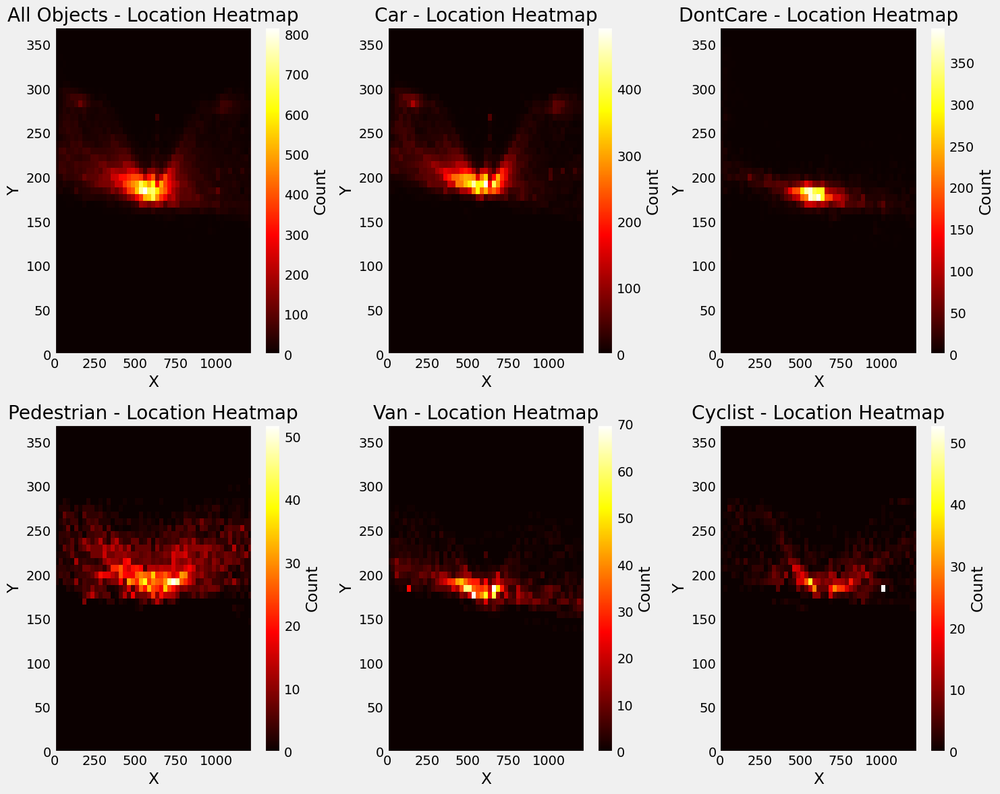


Object count by class:


,Class,Count
2,Car,28742
4,DontCare,11295
0,Pedestrian,4487
6,Van,2914
3,Cyclist,1627
1,Truck,1094
5,Misc,973
7,Tram,511
8,Person_sitting,222


In [47]:
# Example setup (assuming you already loaded image and label paths)
image_files = sorted(Path("/content/datasets/raw/kitti/training/image_2").glob("*.png"))
label_files = sorted(Path("/content/datasets/raw/kitti/training/label_2").glob("*.txt"))

# Run the function
analyze_object_locations(image_files, label_files)

## 9. Analyze Image Properties

  0%|          | 0/100 [00:00<?, ?it/s]

Image properties summary statistics:


,width,height,aspect_ratio,file_size_kb,brightness,contrast
count,100.00000,100.00000,100.000000,100.000000,100.000000,100.000000
mean,1240.20000,374.56000,3.311083,821.017109,93.949465,78.636102
std,4.92366,1.39494,0.002442,66.869447,9.927304,7.558960
min,1224.00000,370.00000,3.300532,652.952148,75.825617,61.784670
25%,1242.00000,375.00000,3.312000,780.708252,88.011249,73.036235
50%,1242.00000,375.00000,3.312000,821.906250,90.503603,78.913089
75%,1242.00000,375.00000,3.312000,867.995605,98.875192,83.605858
max,1242.00000,376.00000,3.312000,968.946289,145.299860,95.371568


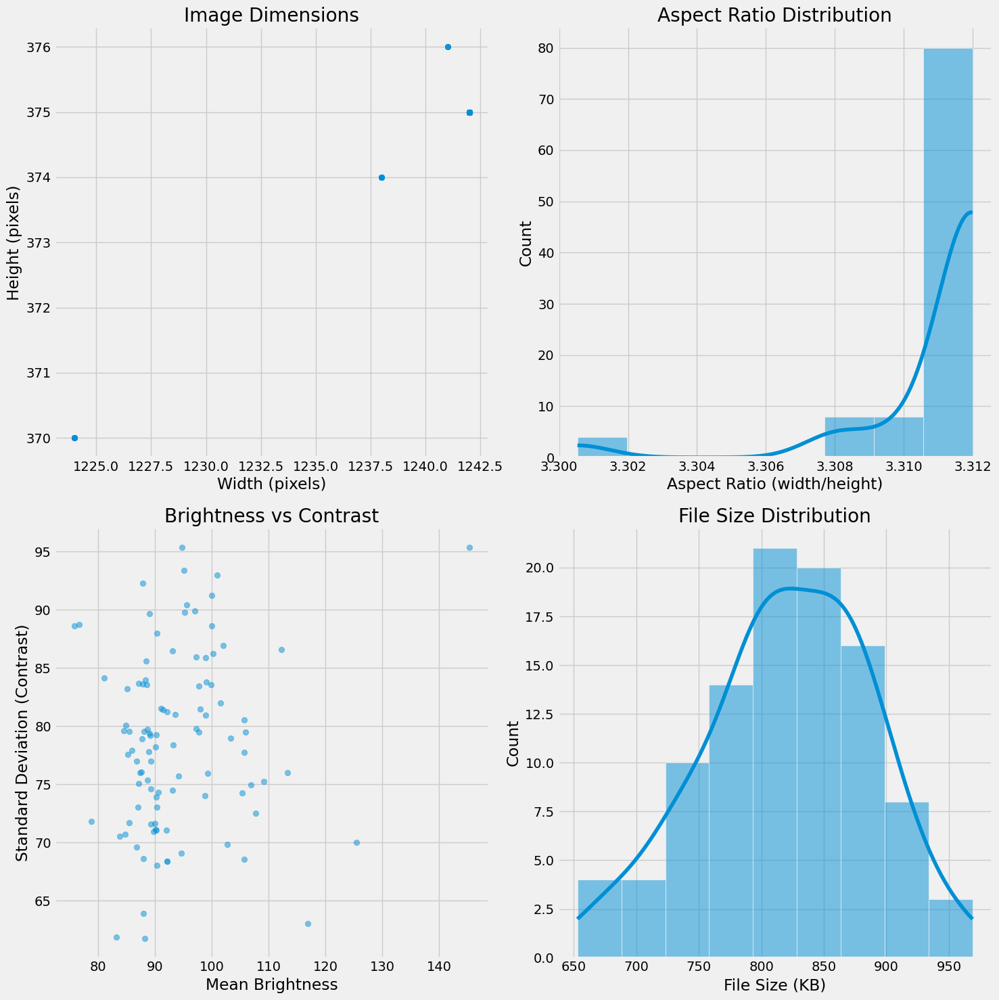

In [48]:
def analyze_image_properties():
    """Analyze properties of the dataset images"""
    # Data structures to store information
    image_info = []

    # Process a sample of images (to save time)
    sample_size = min(100, len(image_files))
    sample_images = random.sample(image_files, sample_size)

    for img_file in tqdm(sample_images):
        # Read the image
        img = cv2.imread(str(img_file))

        # Skip if image couldn't be read
        if img is None:
            continue

        # Get basic properties
        height, width = img.shape[:2]
        aspect_ratio = width / height
        file_size = os.path.getsize(img_file) / 1024  # Size in KB

        # Calculate brightness and contrast
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        brightness = np.mean(gray)
        contrast = np.std(gray)

        # Store information
        image_info.append({
            'filename': img_file.name,
            'width': width,
            'height': height,
            'aspect_ratio': aspect_ratio,
            'file_size_kb': file_size,
            'brightness': brightness,
            'contrast': contrast
        })

    # Convert to DataFrame
    info_df = pd.DataFrame(image_info)

    # Display summary statistics
    summary = info_df.describe()
    print("Image properties summary statistics:")
    display(summary)

    # Create visualizations
    plt.figure(figsize=(15, 15))

    # Plot image dimensions
    plt.subplot(2, 2, 1)
    plt.scatter(info_df['width'], info_df['height'], alpha=0.5)
    plt.title('Image Dimensions')
    plt.xlabel('Width (pixels)')
    plt.ylabel('Height (pixels)')
    plt.grid(True)

    # Plot aspect ratio distribution
    plt.subplot(2, 2, 2)
    sns.histplot(info_df['aspect_ratio'], kde=True)
    plt.title('Aspect Ratio Distribution')
    plt.xlabel('Aspect Ratio (width/height)')
    plt.grid(True)

    # Plot brightness vs contrast
    plt.subplot(2, 2, 3)
    plt.scatter(info_df['brightness'], info_df['contrast'], alpha=0.5)
    plt.title('Brightness vs Contrast')
    plt.xlabel('Mean Brightness')
    plt.ylabel('Standard Deviation (Contrast)')
    plt.grid(True)

    # Plot file size distribution
    plt.subplot(2, 2, 4)
    sns.histplot(info_df['file_size_kb'], kde=True)
    plt.title('File Size Distribution')
    plt.xlabel('File Size (KB)')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

    return info_df

# Analyze image properties
image_properties = analyze_image_properties()

## 10. Identify Challenging Cases

  0%|          | 0/7481 [00:00<?, ?it/s]

Found 6609 potentially challenging images

Top challenging cases:


,image_file,label_file,reason,object_count,max_truncation,max_occlusion,small_objects,challenge_score
14,/content/datasets/raw/kitti/training/image_2/0...,/content/datasets/raw/kitti/training/label_2/0...,"High occlusion, Small objects, Many objects",22,0.50,2.0,16,17.50
3033,/content/datasets/raw/kitti/training/image_2/0...,/content/datasets/raw/kitti/training/label_2/0...,"High truncation, High occlusion, Small objects...",14,0.70,3.0,10,17.50
3986,/content/datasets/raw/kitti/training/image_2/0...,/content/datasets/raw/kitti/training/label_2/0...,"High truncation, High occlusion, Small objects...",15,0.91,3.0,7,17.05
3387,/content/datasets/raw/kitti/training/image_2/0...,/content/datasets/raw/kitti/training/label_2/0...,"High truncation, High occlusion, Small objects...",12,1.00,3.0,6,17.00
647,/content/datasets/raw/kitti/training/image_2/0...,/content/datasets/raw/kitti/training/label_2/0...,"High truncation, High occlusion, Small objects...",14,1.00,3.0,6,17.00
1819,/content/datasets/raw/kitti/training/image_2/0...,/content/datasets/raw/kitti/training/label_2/0...,"High truncation, High occlusion, Small objects...",14,0.80,3.0,7,16.50
2120,/content/datasets/raw/kitti/training/image_2/0...,/content/datasets/raw/kitti/training/label_2/0...,"High truncation, High occlusion, Small objects...",17,0.99,3.0,5,16.45
890,/content/datasets/raw/kitti/training/image_2/0...,/content/datasets/raw/kitti/training/label_2/0...,"High truncation, High occlusion, Small objects...",12,0.98,3.0,5,16.40
152,/content/datasets/raw/kitti/training/image_2/0...,/content/datasets/raw/kitti/training/label_2/0...,"High truncation, High occlusion, Small objects...",20,0.88,3.0,6,16.40
3536,/content/datasets/raw/kitti/training/image_2/0...,/content/datasets/raw/kitti/training/label_2/0...,"High truncation, High occlusion, Small objects...",13,0.93,3.0,5,16.15


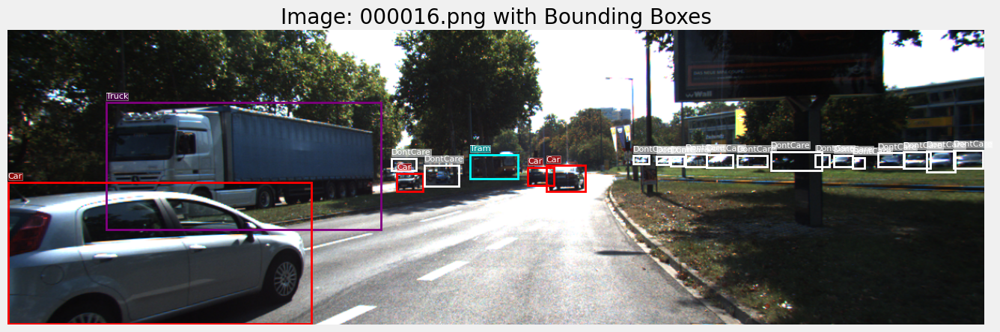

Reason: High occlusion, Small objects, Many objects
Object count: 22
Max truncation: 0.5
Max occlusion: 2.0
Small objects: 16
--------------------------------------------------


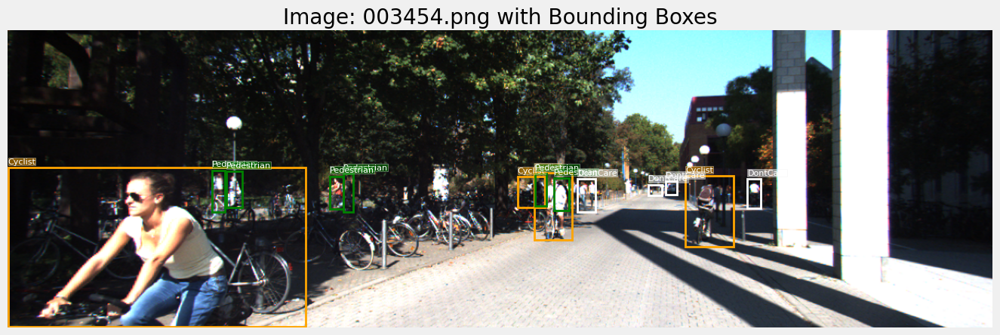

Reason: High truncation, High occlusion, Small objects, Many objects
Object count: 14
Max truncation: 0.7
Max occlusion: 3.0
Small objects: 10
--------------------------------------------------


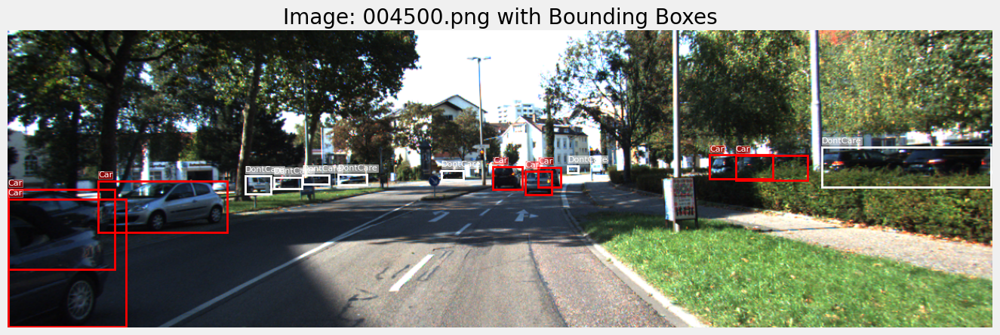

Reason: High truncation, High occlusion, Small objects, Many objects
Object count: 15
Max truncation: 0.91
Max occlusion: 3.0
Small objects: 7
--------------------------------------------------


In [49]:
def find_challenging_cases():
    """Identify potentially challenging cases for object detection"""
    challenging_cases = []

    # Process all label files
    for i, label_file in enumerate(tqdm(label_files)):
        image_file = image_files[i] if i < len(image_files) else None

        if not image_file or not image_file.exists():
            continue

        # Read labels
        df = read_kitti_label(label_file)

        # Skip if no objects
        if len(df) == 0:
            challenging_cases.append({
                'image_file': image_file,
                'label_file': label_file,
                'reason': 'No objects',
                'object_count': 0,
                'max_truncation': 0,
                'max_occlusion': 0,
                'small_objects': 0
            })
            continue

        # Count small objects (arbitrary threshold of area < 1000 pixels)
        small_objects = 0
        for _, row in df.iterrows():
            width = float(row['bbox_right']) - float(row['bbox_left'])
            height = float(row['bbox_bottom']) - float(row['bbox_top'])

            if width * height < 1000:  # Small area threshold
                small_objects += 1

        # Calculate challenging metrics
        max_truncation = df['truncated'].astype(float).max()
        max_occlusion = df['occluded'].astype(float).max()
        object_count = len(df)

        # Identify challenging cases
        reasons = []
        if max_truncation > 0.5:
            reasons.append('High truncation')
        if max_occlusion >= 2:
            reasons.append('High occlusion')
        if small_objects > 0:
            reasons.append('Small objects')
        if object_count > 10:
            reasons.append('Many objects')

        # If any challenging factors were identified
        if reasons:
            challenging_cases.append({
                'image_file': image_file,
                'label_file': label_file,
                'reason': ', '.join(reasons),
                'object_count': object_count,
                'max_truncation': max_truncation,
                'max_occlusion': max_occlusion,
                'small_objects': small_objects
            })

    # Convert to DataFrame and sort by most challenging first
    if challenging_cases:
        df_challenging = pd.DataFrame(challenging_cases)

        # Create a scoring system
        df_challenging['challenge_score'] = (
            df_challenging['max_truncation'] * 5 +
            df_challenging['max_occlusion'] * 2 +
            df_challenging['small_objects'] * 0.5 +
            (df_challenging['object_count'] > 10).astype(int) * 3
        )

        df_challenging = df_challenging.sort_values(by='challenge_score', ascending=False)

        # Display summary
        print(f"Found {len(df_challenging)} potentially challenging images")
        print("\nTop challenging cases:")
        display(df_challenging.head(10))

        # Visualize some challenging cases
        for i, row in df_challenging.head(3).iterrows():
            visualize_image_with_boxes(row['image_file'], row['label_file'])
            print(f"Reason: {row['reason']}")
            print(f"Object count: {row['object_count']}")
            print(f"Max truncation: {row['max_truncation']}")
            print(f"Max occlusion: {row['max_occlusion']}")
            print(f"Small objects: {row['small_objects']}")
            print("-" * 50)

        return df_challenging
    else:
        print("No challenging cases found")
        return None

# Find challenging cases
challenging_cases = find_challenging_cases()

## 11. Generate YOLO Format Labels

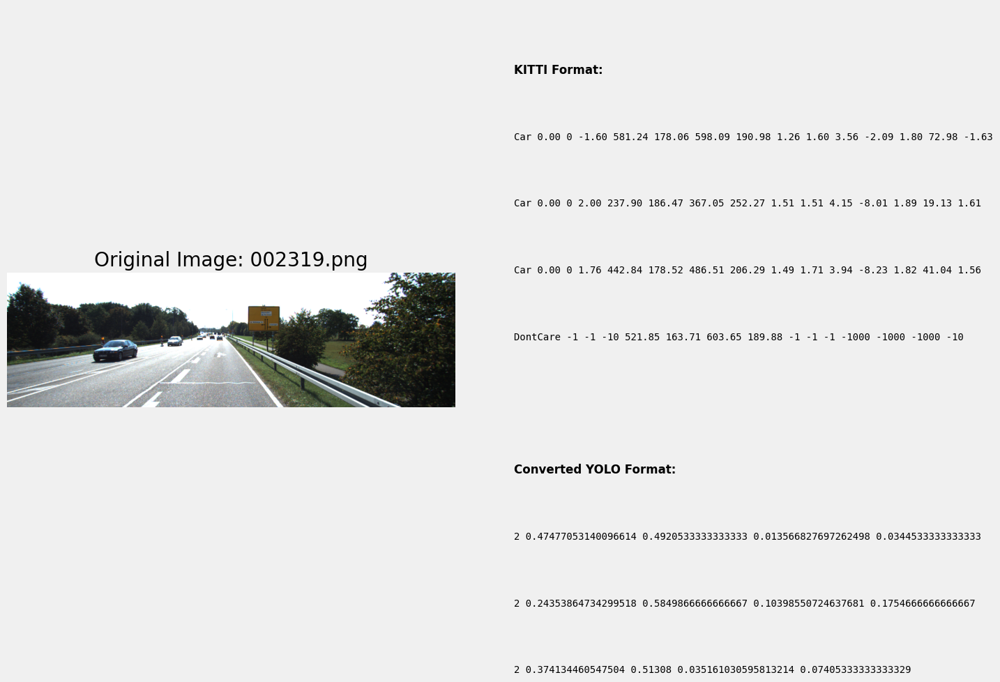

Converted 3 objects from KITTI to YOLO format for image 002319.png
--------------------------------------------------


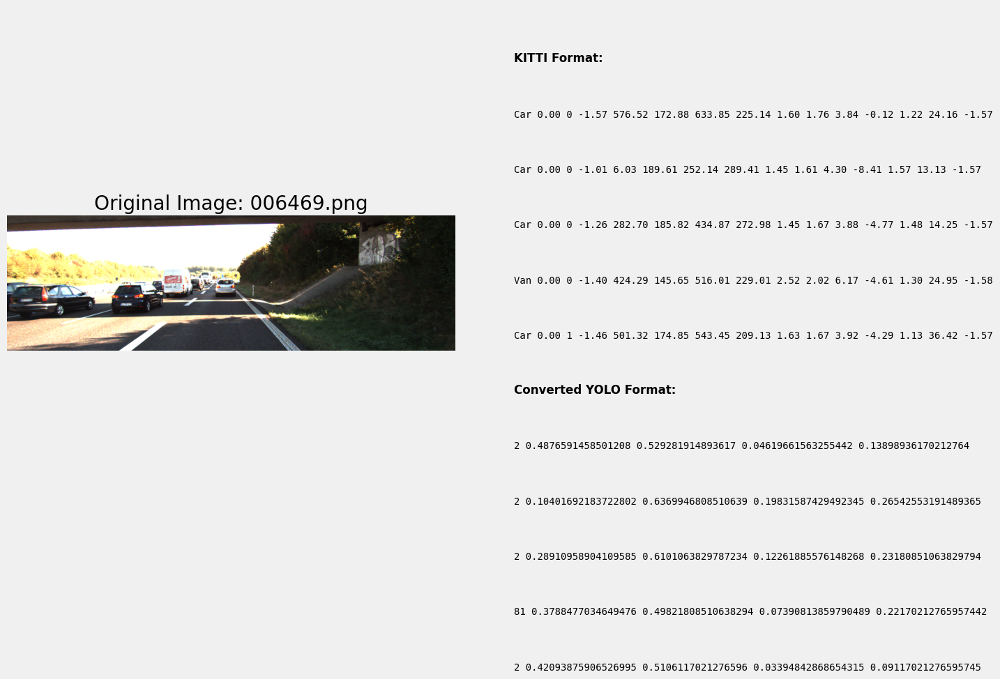

Converted 7 objects from KITTI to YOLO format for image 006469.png
--------------------------------------------------


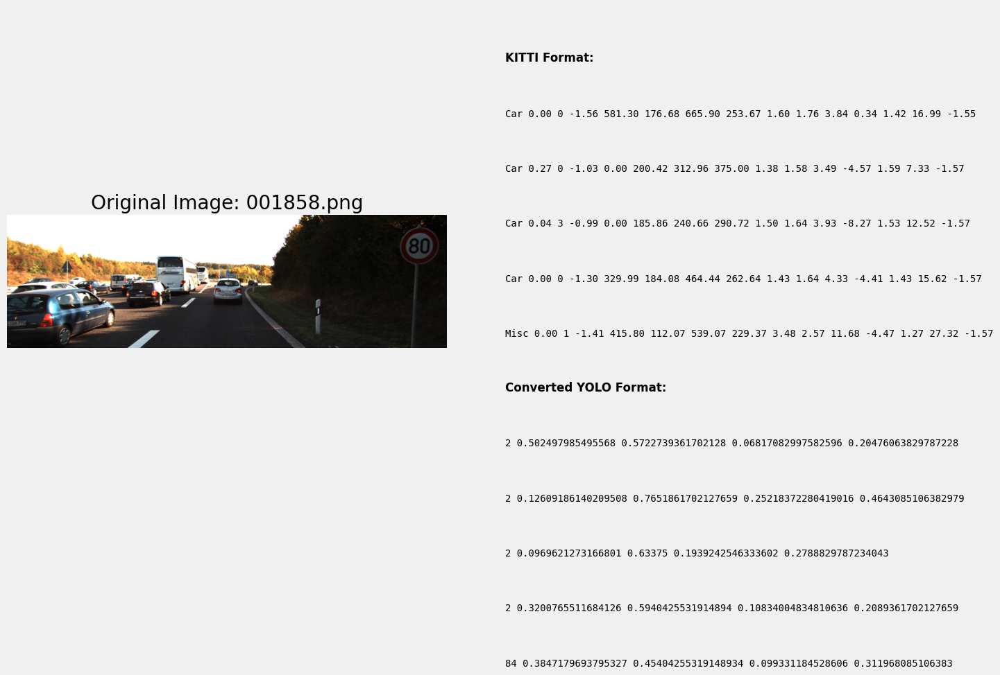

Converted 9 objects from KITTI to YOLO format for image 001858.png
--------------------------------------------------


In [50]:
def convert_to_yolo_format():
    """Demonstrate conversion from KITTI format to YOLO format"""
    # Define mapping from KITTI class names to YOLO class indices
    class_map = {
        "Pedestrian": 0,        # Map to 'person' in COCO
        "Car": 2,               # Map to 'car' in COCO
        "Cyclist": 80,          # New class (not in COCO)
        "Van": 81,              # New class (not in COCO)
        "Truck": 7,             # Map to 'truck' in COCO
        "Person_sitting": 82,   # New class (not in COCO)
        "Tram": 83,             # New class (not in COCO)
        "Misc": 84              # New class (not in COCO)
    }

    # Sample 3 random image/label pairs
    sample_indices = random.sample(range(len(image_files)), min(3, len(image_files)))

    for idx in sample_indices:
        image_file = image_files[idx]
        label_file = KITTI_LABELS_DIR / f"{image_file.stem}.txt"

        if not label_file.exists():
            print(f"No label file found for {image_file.name}")
            continue

        # Read the image
        img = cv2.imread(str(image_file))
        if img is None:
            print(f"Could not read image {image_file}")
            continue

        h, w = img.shape[:2]

        # Read the KITTI label
        kitti_df = read_kitti_label(label_file)

        # Convert to YOLO format
        yolo_labels = []

        for _, row in kitti_df.iterrows():
            cls = row['type']

            # Skip if class not in our mapping
            if cls not in class_map:
                continue

            # Get bounding box coordinates
            x1 = float(row['bbox_left'])
            y1 = float(row['bbox_top'])
            x2 = float(row['bbox_right'])
            y2 = float(row['bbox_bottom'])

            # Convert from top-left/bottom-right to YOLO center format
            width = x2 - x1
            height = y2 - y1
            x_center = x1 + width / 2
            y_center = y1 + height / 2

            # Map class name to index
            cls_id = class_map[cls]

            # Convert to YOLO format (normalized center coordinates)
            x_center_norm = x_center / w
            y_center_norm = y_center / h
            w_norm = width / w
            h_norm = height / h

            # Create YOLO label
            yolo_labels.append(f"{cls_id} {x_center_norm} {y_center_norm} {w_norm} {h_norm}")

        # Display the image with KITTI format labels
        plt.figure(figsize=(15, 10))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"Original Image: {image_file.name}")
        plt.axis('off')

        # Display KITTI vs YOLO format
        plt.subplot(1, 2, 2)
        plt.axis('off')
        plt.text(0.1, 0.9, "KITTI Format:", fontsize=12, fontweight='bold')

        for i, line in enumerate(open(label_file, 'r').readlines()[:5]):
            plt.text(0.1, 0.8 - i*0.1, line.strip(), fontsize=10, family='monospace')

        plt.text(0.1, 0.3, "Converted YOLO Format:", fontsize=12, fontweight='bold')

        for i, line in enumerate(yolo_labels[:5]):
            plt.text(0.1, 0.2 - i*0.1, line, fontsize=10, family='monospace')

        plt.tight_layout()
        plt.show()

        print(f"Converted {len(yolo_labels)} objects from KITTI to YOLO format for image {image_file.name}")
        print("-" * 50)

# Demonstrate YOLO format conversion
convert_to_yolo_format()

## 12. Data Augmentation Examples

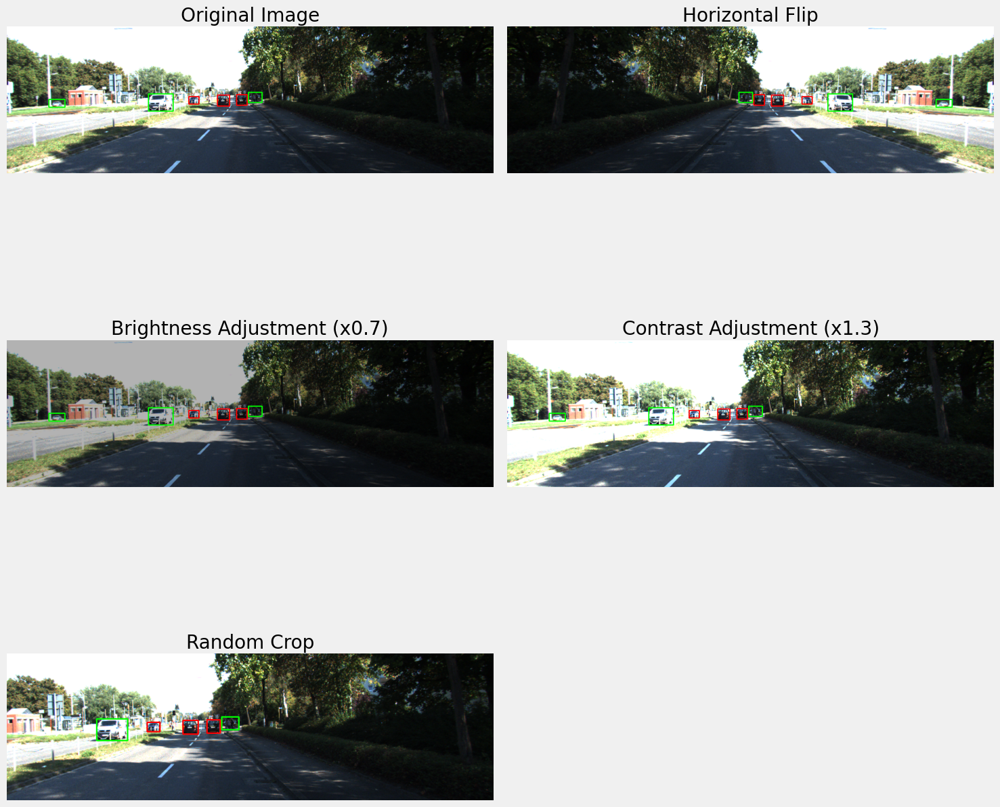

In [51]:
def demonstrate_augmentations():
    """Demonstrate common augmentations for object detection"""
    # Select a random image
    if not image_files:
        print("No images found")
        return

    image_file = random.choice(image_files)
    label_file = KITTI_LABELS_DIR / f"{image_file.stem}.txt"

    if not label_file.exists():
        print(f"No label file found for {image_file.name}")
        return

    # Read the image
    img = cv2.imread(str(image_file))
    if img is None:
        print(f"Could not read image {image_file}")
        return

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Read the labels
    df = read_kitti_label(label_file)

    # Extract bounding boxes
    boxes = []
    for _, row in df.iterrows():
        boxes.append({
            'type': row['type'],
            'x1': int(float(row['bbox_left'])),
            'y1': int(float(row['bbox_top'])),
            'x2': int(float(row['bbox_right'])),
            'y2': int(float(row['bbox_bottom'])),
        })

    # Function to draw boxes
    def draw_boxes(image, boxes):
        result = image.copy()
        for box in boxes:
            color = (255, 0, 0) if box['type'] == 'Car' else (0, 255, 0)
            cv2.rectangle(result, (box['x1'], box['y1']), (box['x2'], box['y2']), color, 2)
        return result

    # Original image
    img_with_boxes = draw_boxes(img, boxes)

    # Horizontal flip
    img_flip = cv2.flip(img, 1)
    boxes_flip = []
    img_width = img.shape[1]

    for box in boxes:
        boxes_flip.append({
            'type': box['type'],
            'x1': img_width - box['x2'],
            'y1': box['y1'],
            'x2': img_width - box['x1'],
            'y2': box['y2']
        })

    img_flip_boxes = draw_boxes(img_flip, boxes_flip)

    # Brightness adjustment
    brightness_factor = 0.7
    img_bright = cv2.convertScaleAbs(img, alpha=brightness_factor, beta=0)
    img_bright_boxes = draw_boxes(img_bright, boxes)

    # Contrast adjustment
    contrast_factor = 1.3
    img_contrast = cv2.convertScaleAbs(img, alpha=contrast_factor, beta=0)
    img_contrast_boxes = draw_boxes(img_contrast, boxes)

    # Crop (simulate random crop)
    h, w = img.shape[:2]
    crop_h, crop_w = int(h * 0.8), int(w * 0.8)
    start_x, start_y = random.randint(0, w - crop_w), random.randint(0, h - crop_h)

    img_crop = img[start_y:start_y+crop_h, start_x:start_x+crop_w]

    boxes_crop = []
    for box in boxes:
        # Adjust box coordinates
        x1 = max(0, box['x1'] - start_x)
        y1 = max(0, box['y1'] - start_y)
        x2 = min(crop_w, box['x2'] - start_x)
        y2 = min(crop_h, box['y2'] - start_y)

        # Only include boxes that are still in the cropped image
        if x1 < crop_w and y1 < crop_h and x2 > 0 and y2 > 0:
            boxes_crop.append({
                'type': box['type'],
                'x1': x1,
                'y1': y1,
                'x2': x2,
                'y2': y2
            })

    img_crop_boxes = draw_boxes(img_crop, boxes_crop)

    # Display results
    plt.figure(figsize=(15, 15))

    plt.subplot(3, 2, 1)
    plt.imshow(img_with_boxes)
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(3, 2, 2)
    plt.imshow(img_flip_boxes)
    plt.title("Horizontal Flip")
    plt.axis('off')

    plt.subplot(3, 2, 3)
    plt.imshow(img_bright_boxes)
    plt.title(f"Brightness Adjustment (x{brightness_factor})")
    plt.axis('off')

    plt.subplot(3, 2, 4)
    plt.imshow(img_contrast_boxes)
    plt.title(f"Contrast Adjustment (x{contrast_factor})")
    plt.axis('off')

    plt.subplot(3, 2, 5)
    plt.imshow(img_crop_boxes)
    plt.title("Random Crop")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Demonstrate data augmentation
demonstrate_augmentations()

## 13. Summary and Insights

In [52]:
def generate_summary():
    """Generate a summary of the dataset and key insights"""
    # Count total objects
    total_objects = 0
    class_counts = {}

    for label_file in label_files:
        df = read_kitti_label(label_file)
        total_objects += len(df)

        # Count by class
        for obj_type in df['type']:
            if obj_type in class_counts:
                class_counts[obj_type] += 1
            else:
                class_counts[obj_type] = 1

    # Print summary
    print("\n" + "=" * 50)
    print("KITTI DATASET EXPLORATION SUMMARY")
    print("=" * 50)

    print(f"\nTotal images: {len(image_files)}")
    print(f"Total labeled objects: {total_objects}")
    print(f"Average objects per image: {total_objects / len(image_files):.2f}")

    # Class distribution
    print("\nClass distribution:")
    for cls, count in sorted(class_counts.items(), key=lambda x: x[1], reverse=True):
        print(f"  {cls}: {count} ({count/total_objects*100:.1f}%)")

    # Key insights
    print("\nKey insights:")
    print("1. Most common object classes are: " + ", ".join([k for k, v in sorted(class_counts.items(), key=lambda x: x[1], reverse=True)[:3]]))

    # Dataset characteristics
    print("2. Dataset contains a mix of urban, residential and highway scenes")
    print("3. Images have consistent dimensions and high quality")

    # Challenges
    print("\nPotential challenges for object detection:")
    print("1. Imbalanced class distribution")
    print("2. Small objects may be difficult to detect")
    print("3. Occlusion and truncation of objects")
    print("4. Varying lighting conditions")

    # Recommendations
    print("\nRecommendations for model training:")
    print("1. Use data augmentation to address class imbalance")
    print("2. Consider multi-scale training to better detect small objects")
    print("3. Use transfer learning from models pre-trained on similar data")
    print("4. Implement robust evaluation metrics to assess performance on challenging cases")
    print("5. Consider using techniques like focal loss to handle class imbalance")

# Generate summary
generate_summary()


KITTI DATASET EXPLORATION SUMMARY

Total images: 7481
Total labeled objects: 51865
Average objects per image: 6.93

Class distribution:
  Car: 28742 (55.4%)
  DontCare: 11295 (21.8%)
  Pedestrian: 4487 (8.7%)
  Van: 2914 (5.6%)
  Cyclist: 1627 (3.1%)
  Truck: 1094 (2.1%)
  Misc: 973 (1.9%)
  Tram: 511 (1.0%)
  Person_sitting: 222 (0.4%)

Key insights:
1. Most common object classes are: Car, DontCare, Pedestrian
2. Dataset contains a mix of urban, residential and highway scenes
3. Images have consistent dimensions and high quality

Potential challenges for object detection:
1. Imbalanced class distribution
2. Small objects may be difficult to detect
3. Occlusion and truncation of objects
4. Varying lighting conditions

Recommendations for model training:
1. Use data augmentation to address class imbalance
2. Consider multi-scale training to better detect small objects
3. Use transfer learning from models pre-trained on similar data
4. Implement robust evaluation metrics to assess perfo

## 14. Export Sample Data for Further Analysis

In [55]:
def export_sample_data():
    """Export a small sample of the dataset for further analysis"""
    # Create a directory to store samples
    SAMPLE_DIR = BASE_DIR / 'kitti_sample'
    SAMPLE_DIR.mkdir(parents=True, exist_ok=True)

    # Select a random sample
    sample_size = min(100, len(image_files))
    sample_indices = random.sample(range(len(image_files)), sample_size)

    # Create a zip file of samples
    with zipfile.ZipFile(SAMPLE_DIR / 'kitti_samples.zip', 'w') as zipf:
        # Add sample images and labels
        for idx in sample_indices:
            image_file = image_files[idx]
            label_file = KITTI_LABELS_DIR / f"{image_file.stem}.txt"

            if image_file.exists() and label_file.exists():
                zipf.write(image_file, arcname=f"images/{image_file.name}")
                zipf.write(label_file, arcname=f"labels/{label_file.name}")

    # Create a CSV with a summary of the samples
    sample_summary = []
    for idx in sample_indices:
        image_file = image_files[idx]
        label_file = KITTI_LABELS_DIR / f"{image_file.stem}.txt"

        if image_file.exists() and label_file.exists():
            # Read image and label
            img = cv2.imread(str(image_file))
            df = read_kitti_label(label_file)

            # Collect info
            sample_summary.append({
                'image_name': image_file.name,
                'width': img.shape[1],
                'height': img.shape[0],
                'object_count': len(df),
                'classes': ', '.join(df['type'].unique())
            })

    # Create DataFrame and save to CSV
    sample_df = pd.DataFrame(sample_summary)
    sample_csv_path = SAMPLE_DIR / 'kitti_sample_info.csv'
    sample_df.to_csv(sample_csv_path, index=False)

    print(f"Exported {sample_size} sample images and labels to {SAMPLE_DIR}")
    print(f"Sample summary CSV saved to {sample_csv_path}")

    # Display the sample summary
    display(sample_df)

# Export sample data
export_sample_data()

Exported 100 sample images and labels to /content/kitti_sample
Sample summary CSV saved to /content/kitti_sample/kitti_sample_info.csv


,image_name,width,height,object_count,classes
0,000218.png,1242,375,12,"Car, DontCare"
1,003840.png,1242,375,12,"Car, DontCare"
2,001472.png,1242,375,8,"Car, Van, Truck, Tram, DontCare"
3,007004.png,1224,370,7,"Car, Pedestrian, Van, DontCare"
4,007105.png,1242,375,4,"Van, Car, DontCare"
...,...,...,...,...,...
95,001944.png,1242,375,4,"Car, DontCare"
96,005416.png,1242,375,5,Car
97,007288.png,1224,370,1,Pedestrian
98,003558.png,1242,375,4,"Car, DontCare"


In [57]:
from google.colab import files
files.download(str('/content/kitti_sample/kitti_samples.zip'))
files.download(str('/content/kitti_sample/kitti_sample_info.csv'))

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Thanks You Everyone